In [ ]:
import numpy as np
import requests
import os
import cv2
import matplotlib.pyplot as plt
import random
import PIL.Image as Image
import numpy as np
%matplotlib inline


In [ ]:
!gdown 1g5_97VR9YTLO9sdRgZNgD_rQ0Xb98k_Y #data1
!gdown 1z_8-pH-22FQ_nKMEj8MIBv07Rd8_nLVh #data2
!unzip -qo data.zip

Downloading...
From: https://drive.google.com/uc?id=1g5_97VR9YTLO9sdRgZNgD_rQ0Xb98k_Y
To: /content/data.zip
100% 11.0M/11.0M [00:00<00:00, 100MB/s] 
Downloading...
From: https://drive.google.com/uc?id=1z_8-pH-22FQ_nKMEj8MIBv07Rd8_nLVh
To: /content/data2.zip
100% 5.78M/5.78M [00:00<00:00, 133MB/s]


# Utility Functions
functions to help you run the notebook more easily

In [ ]:
def show_image(image , cmap = None):
    plt.figure(figsize=(4, 4))
    plt.imshow(image , cmap=cmap )
    #plt.axis('off')
    plt.show()


# image noising & denoising

In [ ]:
def show_noise(orignal, noise , output):
    fig=plt.figure(figsize=(8,3),dpi=300)

    fig.add_subplot(1,3,1)
    plt.imshow(orignal,cmap='gray')
    plt.axis("off")
    plt.title("Original")

    fig.add_subplot(1,3,2)
    plt.imshow(noise,cmap='gray')
    plt.axis("off")
    plt.title("Noise")

    fig.add_subplot(1,3,3)
    plt.imshow(output,cmap='gray')
    plt.axis("off")
    plt.title("Combined")

image = cv2.imread('data/sample_image_g2.tif',cv2.IMREAD_GRAYSCALE)

## noising

**Shot Noise (Poisson):** Poisson noise arising from random fluctuations in photon arrival during image acquisition. It often appears as a grainy pattern with intensity proportional to the original pixel value.



46.789353370666504


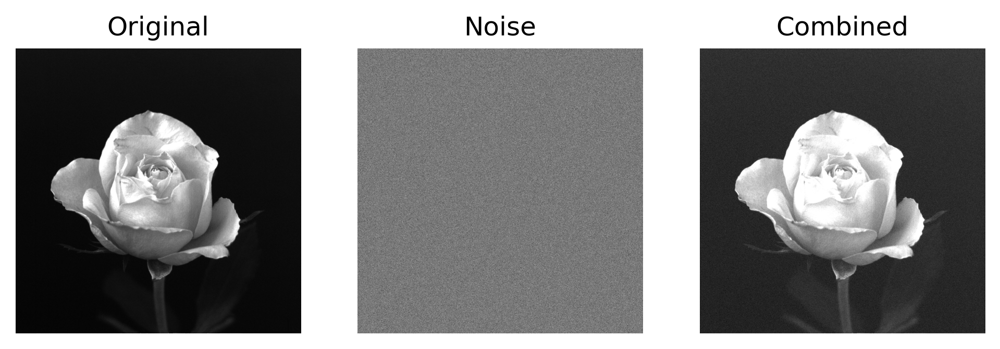

In [ ]:
def add_shot_noise(image ,lmbda = 0):
    noise = np.random.poisson( lmbda, size=image.shape).astype(np.float32)
    noisy_image = np.clip(image + noise,0,255).astype(np.uint8)
    return noise, noisy_image

print(image.mean())
noise , image_noised = add_shot_noise(image,60)
show_noise( image, noise , image_noised)

**Salt-and-Pepper Noise (Impulse Noise):** Randomly occurring pixels with extreme intensity values (either black or white). It resembles salt and pepper particles sprinkled on the image.



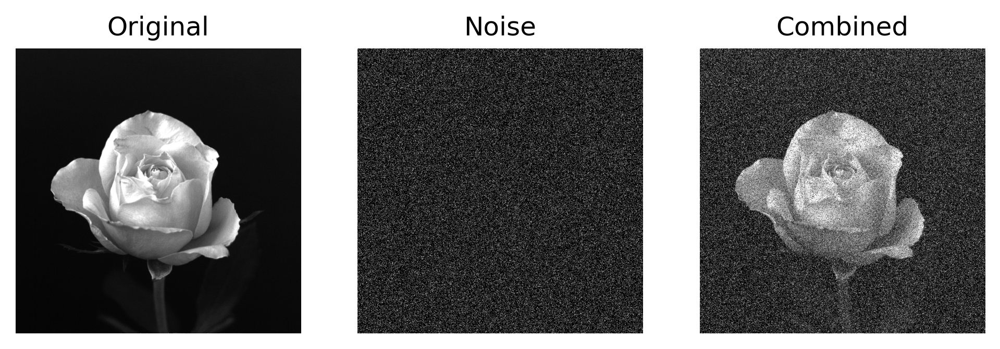

In [ ]:
def add_salt_and_pepper_noise(image, probability=0.1):
    noisy_image = image.copy()
    # Generate random values for each pixel
    random_vals = np.random.random(image.shape[:2])

    # Create salt noise (white pixels) - top half of probability range
    salt_mask = random_vals < probability / 2

    # Create pepper noise (black pixels) - bottom half of probability range
    pepper_mask = random_vals > (1 - probability / 2)

    # Apply salt noise (set to maximum value)
    if len(image.shape) == 3:  # Color image
        noisy_image[salt_mask] = [255, 255, 255]
        noisy_image[pepper_mask] = [0, 0, 0]
    else:  # Grayscale image
        noisy_image[salt_mask] = 255
        noisy_image[pepper_mask] = 0
    noise = (salt_mask*255 + pepper_mask ).astype(np.uint8)
    return noise , noisy_image


noise , image_noised = add_salt_and_pepper_noise(image, probability=0.3)
show_noise( image, noise , image_noised)


**Gaussian Noise:** Random noise following a Gaussian distribution, adding variations around the mean intensity value. It introduces a smooth, bell-shaped noise pattern.


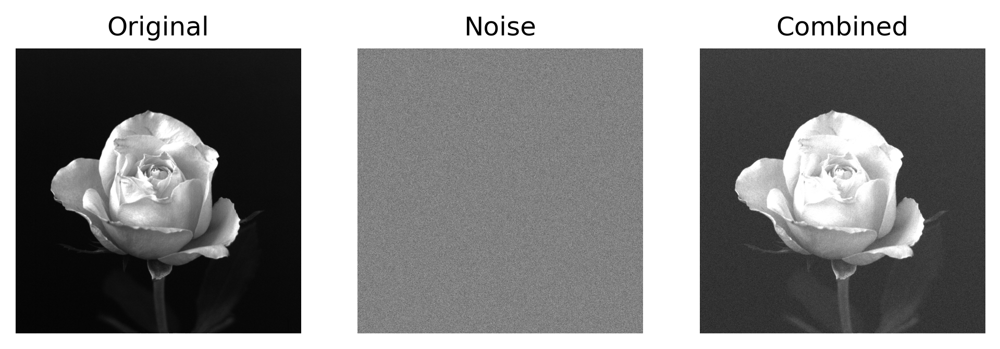

In [ ]:
def add_gaussian_noise(image, mean=0, sigma=0.01, scaling =0.5):
    gauss_noise=np.zeros( image.shape[:2] ,dtype=np.uint8)
    cv2.randn(gauss_noise,mean,sigma)
    noise=(gauss_noise*scaling).astype(np.uint8)
    noisy_image=cv2.add(image,noise)
    return noise, noisy_image

noise , image_noised = add_gaussian_noise(image, 120, 20)
show_noise( image, noise , image_noised)


**Uniform Noise:** Random noise with values uniformly distributed within a specified range. It produces a more speckled appearance compared to Gaussian noise.

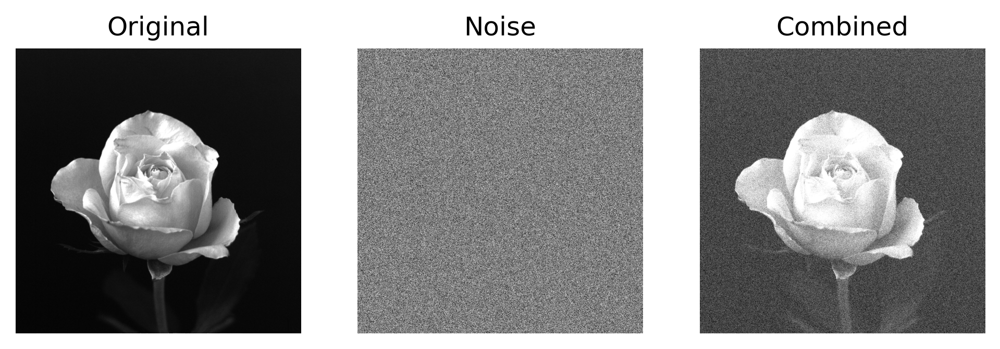

In [ ]:
def add_uniform_noise(image, low=0, high=255 , scaling =0.5):
    uni_noise=np.zeros( image.shape[:2] ,dtype=np.uint8)
    cv2.randu(uni_noise,low,high)
    noise=(uni_noise*scaling).astype(np.uint8)
    noisy_image=cv2.add(image,noise)
    return noise, noisy_image

noise , image_noised =  add_uniform_noise(image, 1, 255 )
show_noise( image, noise , image_noised)

## Denoising

In [ ]:
#noise , image_noised = add_shot_noise(image ,lmbda = 0)
# noise , image_noised = add_salt_and_pepper_noise(image, probability=0.1)
noise , image_noised = add_gaussian_noise(image, mean=128, sigma=20)
# noise , image_noised = add_uniform_noise(image, 0, 255 )

### Using builtin function fastNlMeansDenoising¶


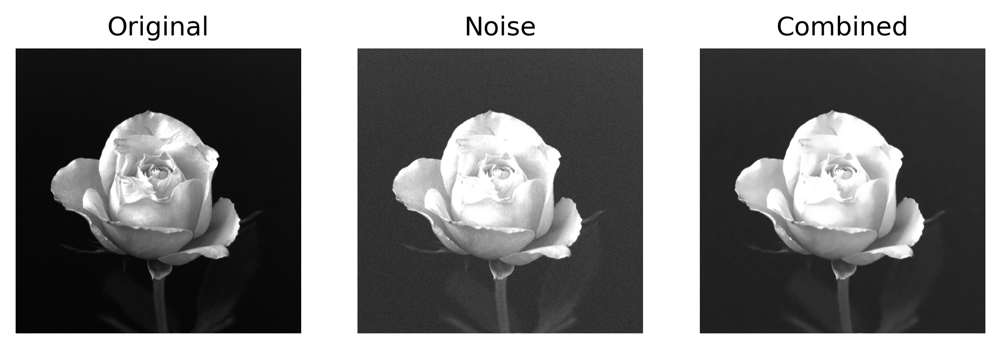

In [ ]:
image_denoised = cv2.fastNlMeansDenoising(image_noised,None,9,9)

#show_noise( image_noised, noise , image_denoised)
show_noise( image , image_noised,  image_denoised)

## Median Blur
The Median Filter takes all the pixels under a kernel area and replaces the center element with the median value. It is meant to be highly effective against Impulse noise.

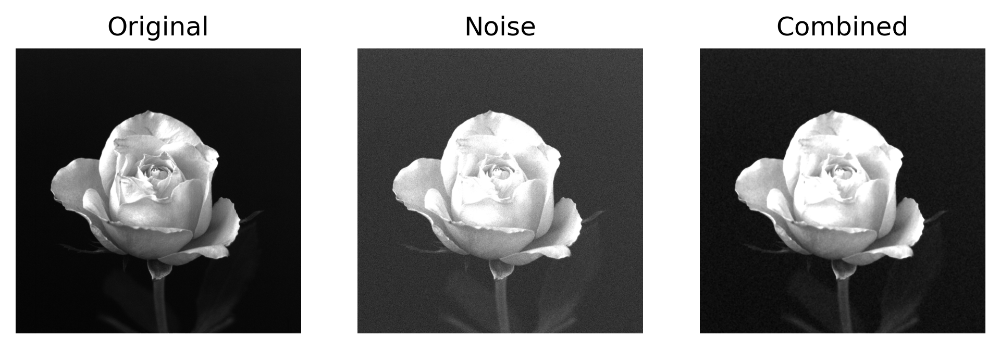

In [ ]:
image_denoised = cv2.medianBlur(image_noised,5)

#show_noise( image_noised, noise , image_denoised)
show_noise( image , image_noised,  image_denoised)

## Gaussian Blur
This method employs a Gaussian Kernel in place of a box filter and is said to be effective against Gaussian Noise.

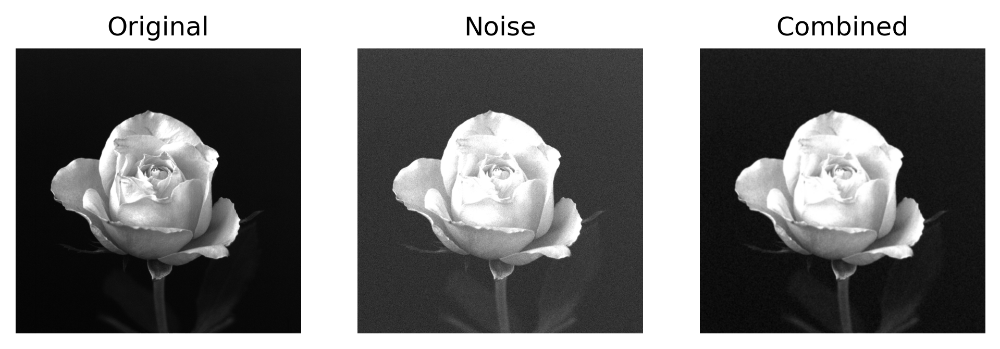

In [ ]:
#image_noised = add_gaussian_noise(image, mean=128, sigma=4)[1]
image_denoised = cv2.GaussianBlur(image_noised ,(7,7),0,0)

#show_noise( image_noised, noise , image_denoised)
show_noise( image , image_noised,  image_denoised)